### Install SDK

In [5]:
%pip install -U -q "google-genai>=1.5.0"
%pip show google-genai

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Name: google-genai
Version: 1.5.0
Summary: GenAI Python SDK
Home-page: https://github.com/googleapis/python-genai
Author: 
Author-email: Google LLC <googleapis-packages@google.com>
License: Apache-2.0
Location: C:\Users\Alphabase\AppData\Roaming\Python\Python313\site-packages
Requires: anyio, google-auth, httpx, pydantic, requests, typing-extensions, websockets
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install python-dotenv

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### Setup your API key

In [1]:
import os
from dotenv import load_dotenv


load_dotenv()
GOOGLE_API_KEY = os.getenv("GOOGLE_API_KEY")


### Initialize SDK client

With the new SDK you now only need to initialize a client with you API key (or OAuth if using [Vertex AI](https://link_to_vertex_AI)). The model is now set in each call.

In [8]:
from google import genai
from google.genai import types

client = genai.Client(api_key=GOOGLE_API_KEY)

### Select a model

Image-out is a new [Gemini 2.0](https://ai.google.dev/gemini-api/docs/models/gemini-v2) experimental capability, so at the moment you will have to use the `gemini-2.0.flash-exp`.

For more information about all Gemini models, check the [documentation](https://ai.google.dev/gemini-api/docs/models/gemini) for extended information on each of them.


In [9]:
MODEL_ID = "gemini-2.0-flash-exp"

### Load modules


In [10]:
import requests
import mimetypes
import os

### Utils

In [11]:
from IPython.display import display, Markdown, Image
import pathlib


def display_response(response):
  for part in response.candidates[0].content.parts:
    if part.text is not None:
      display(Markdown(part.text))
    elif part.inline_data is not None:
      mime = part.inline_data.mime_type
      print(mime)
      data = part.inline_data.data
      display(Image(data=data))

def save_image(response, path):
  for part in response.candidates[0].content.parts:
    if part.text is not None:
      continue
    elif part.inline_data is not None:
      mime = part.inline_data.mime_type
      data = part.inline_data.data
      pathlib.Path(path).write_bytes(data)

## Generate images

Use `response_modalities` to indicate to the model that you are expeting an image in the ouput.

Remember that generating people is not allowed at the moment.

image/png


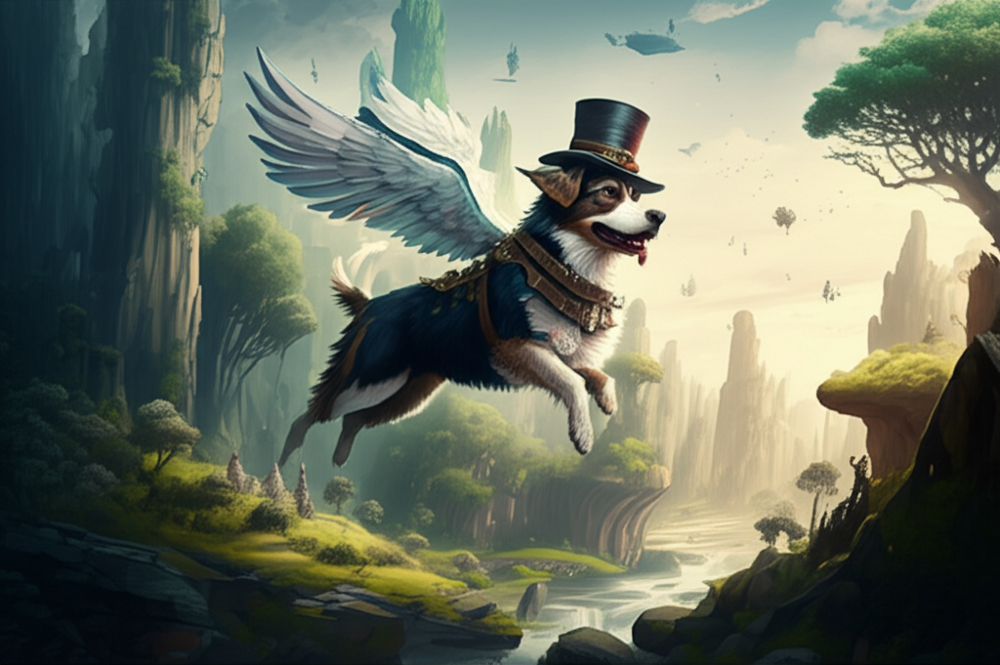

In [12]:
contents = 'Hi, can create a minimalistic image of a dog with wings and a top hat flying over a happy futuristic scifi city with lots of greenery?'

response = client.models.generate_content(
    model=MODEL_ID,
    contents=contents,
    config=types.GenerateContentConfig(
        response_modalities=['Text', 'Image']
    )
)

display_response(response)
save_image(response, 'flying_dog.png')

## Edit images

You can also do image editing, simply pass the original one as part of the prompt.

image/png


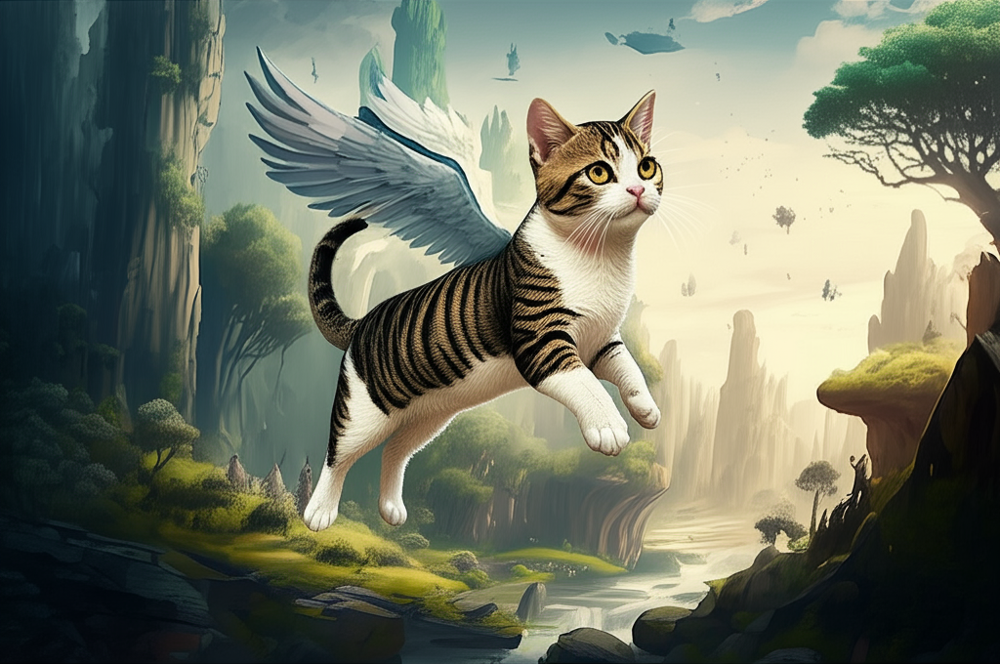

In [13]:
import PIL

response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        "Hey, could you edit this image to make a cat instead of a pig?",
        PIL.Image.open('flying_dog.png')
    ],
    config=types.GenerateContentConfig(
        response_modalities=['Text', 'Image']
    )
)

display_response(response)
save_image(response, 'flying_cat.png')

## Get multiple images

So far you've only generated one image per call, but you can actually request way more than that! Let's try a chocolate cake receipe.

image/png


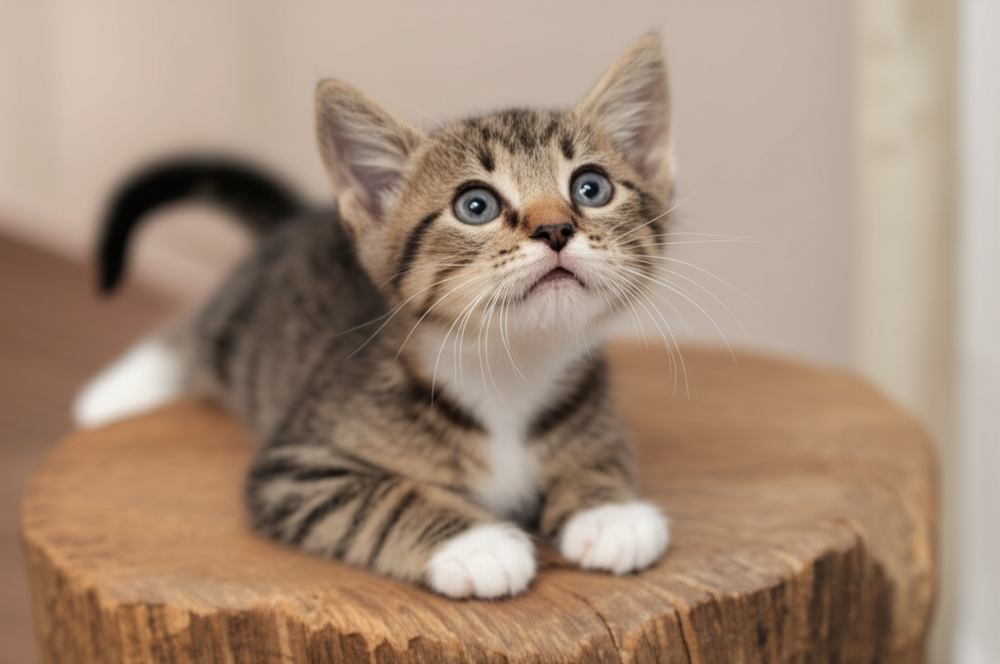



Image 1: A tiny kitten, still clumsy and exploring the world with wide, curious eyes.



image/png


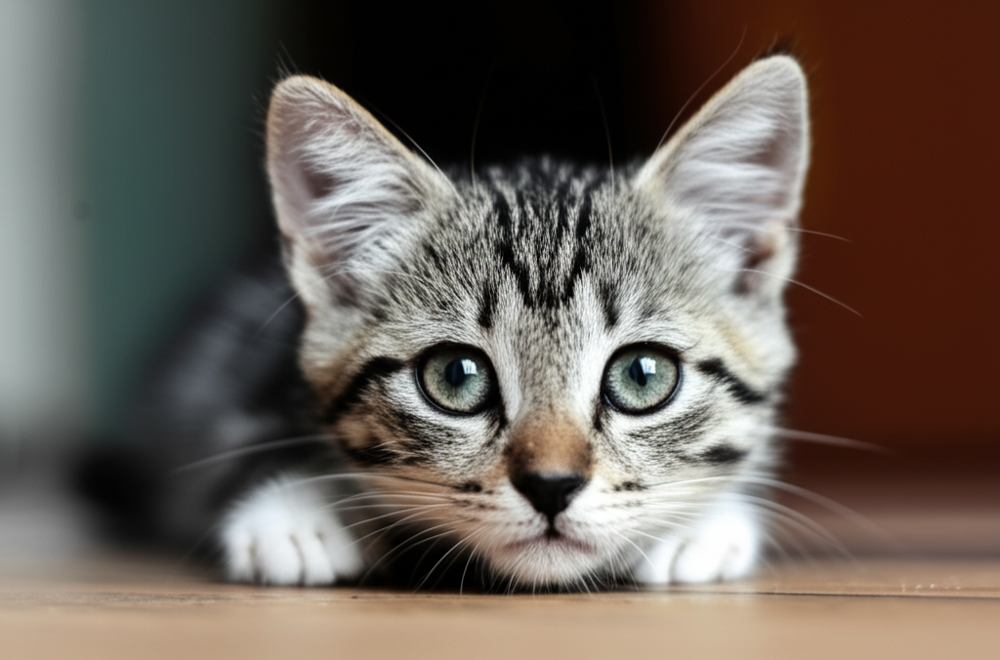



Image 2: A growing kitten, more agile and playful, starting to develop its personality.



image/png


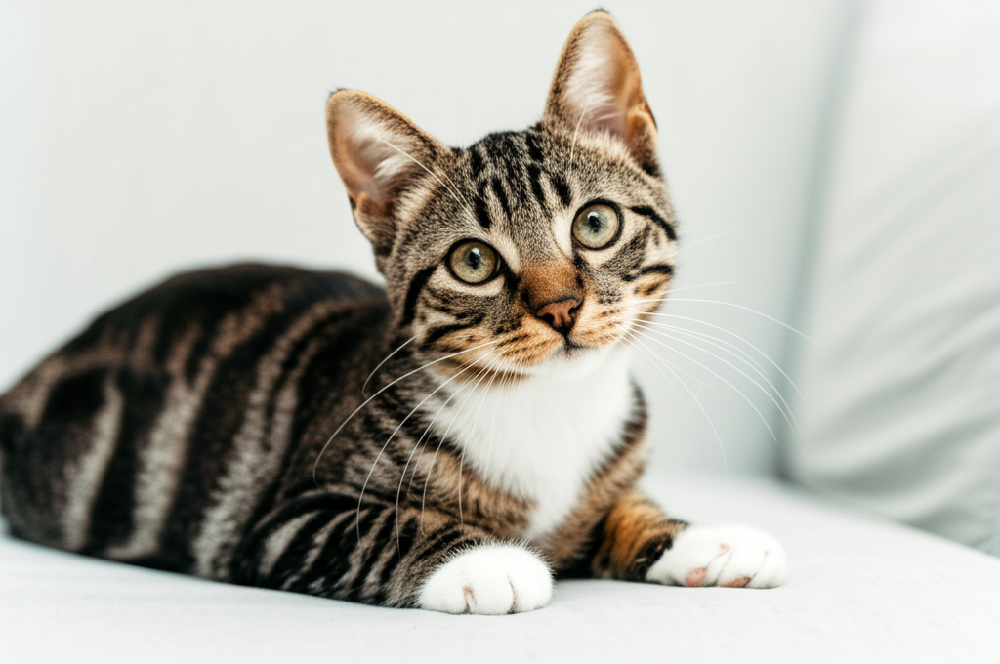



Image 3: A young adult cat, confident and graceful, now a fully grown member of the family.

In [14]:
contents = 'Show me how to cats grow in 3 images.'

response = client.models.generate_content(
    model=MODEL_ID,
    contents=contents,
    config=types.GenerateContentConfig(
        response_modalities=['Text', 'Image']
    )
)

display_response(response)

# Be careful; long output (see below)

## Chat (recommended)

So far you've used unary calls, but Image-out is actually made to work better with chat mode as it's easier to iterate on an image turn after turn.

In [15]:
chat = client.chats.create(
    model=MODEL_ID,
    config=types.GenerateContentConfig(
        response_modalities=['Text', 'Image']
    )
)

image/png


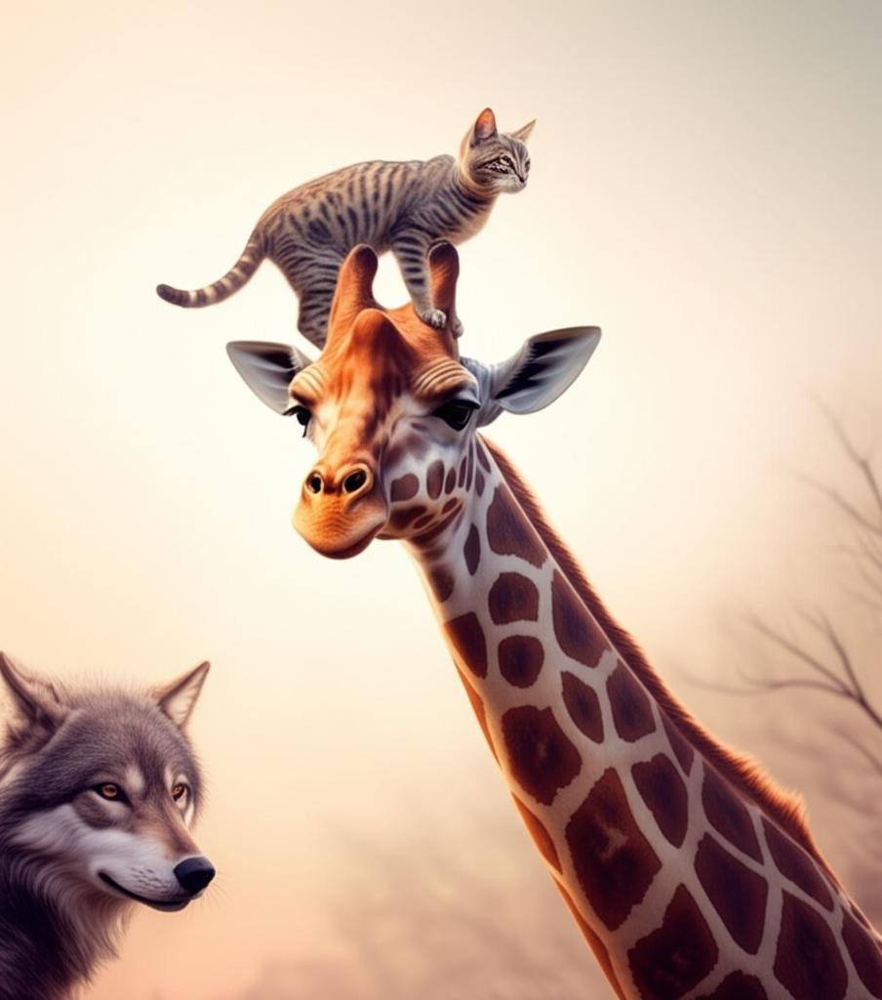

In [16]:
response = chat.send_message('can you draw a realistic looking giraffe, with a cat on it\'s head, and a wolf the background?')
display_response(response)

image/png


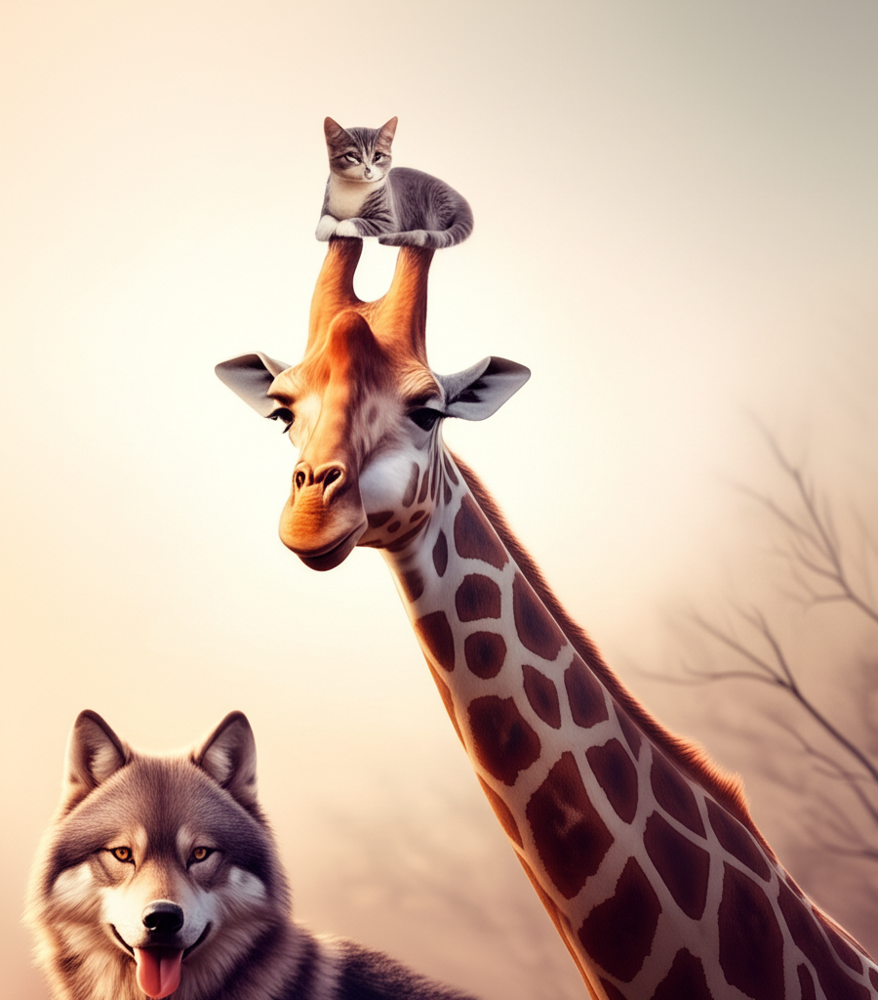

In [17]:
response = chat.send_message('Can you make it realistic?')
display_response(response)

image/png


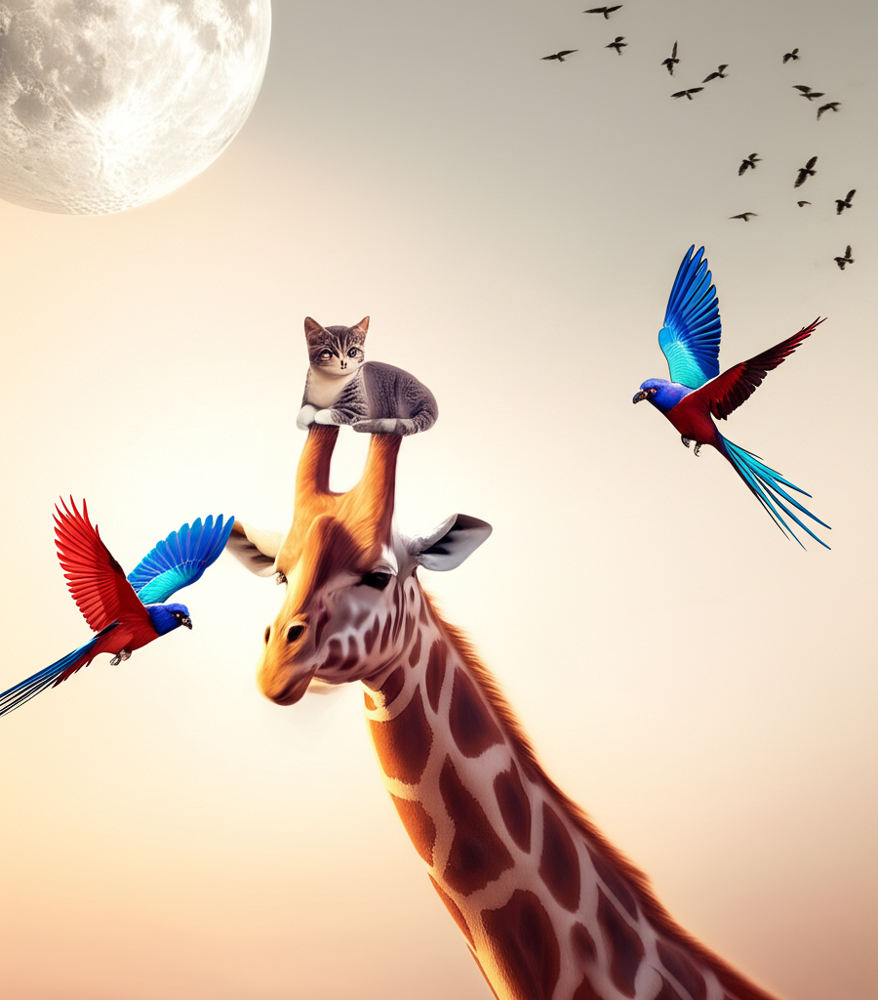

In [18]:
response = chat.send_message('Can you add a moon and some colorful birds?')
display_response(response)